This notebook is to annotate the output of iqtree based on the columns of the cog_uk metadata file.

The [Epidemiologist R Handbook](https://epirhandbook.com/en/phylogenetic-trees-1.html) is a good resource for learning `ggtree`.

In [1]:
library(phangorn)
library(ggtreeExtra)
library(ggtree)
library(ggnewscale)
library(colorspace);
library(RColorBrewer);
library(dplyr)
library(tidyr)
library(ggplot2)
library (ggpubr)
library (stringr)
library(castor)
library(lubridate)

Loading required package: ape

code for methods in class “Rcpp_Fitch” was not checked for suspicious field assignments (recommended package ‘codetools’ not available?)

code for methods in class “Rcpp_Fitch” was not checked for suspicious field assignments (recommended package ‘codetools’ not available?)

ggtreeExtra v1.4.1  For help: https://yulab-smu.top/treedata-book/

If you use ggtreeExtra in published research, please cite the paper:

S Xu, Z Dai, P Guo, X Fu, S Liu, L Zhou, W Tang, T Feng, M Chen, L Zhan, T Wu, E Hu, Y Jiang, X Bo, G Yu. ggtreeExtra: Compact visualization of richly annotated phylogenetic data. Molecular Biology and Evolution 2021, 38(9):4039-4042. doi: 10.1093/molbev/msab166



ggtree v3.2.1  For help: https://yulab-smu.top/treedata-book/

If you use ggtree in published research, please cite the most appropriate paper(s):

1. Guangchuang Yu. Using ggtree to visualize data on tree-like structures. Current Protocols in Bioinformatics. 2020, 69:e96. doi:10.1002/cpb

In [2]:
treefile <- "/home/madeline/Desktop/git_temp/QIB_Internship/data/allseqs.aln.treefile"
annotations <- "/home/madeline/Desktop/git_temp/QIB_Internship/data/figtree_annotation.tsv"

In [3]:
tbl0 <- read.csv (annotations, sep = "\t") 
tbl0[is.na(tbl0)] <- ""   ## mising country info messes with startsWith()
tre <- read.tree (treefile)

In [4]:
traits <- tbl0 %>% slice(match(tre$tip.label, sequence_name)) #these already match, but this line means you could use the entire cog_uk metadata
rownames(traits) <- traits$sequence_name
traits$code <- substr(traits$central_sample_id,1,4)

In [5]:
head(traits)

,sequence_name,is_uk,is_cog_uk,central_sample_id,secondary_identifier,sample_date,epi_week,country,adm1,is_surveillance,is_travel_history,travel_history,lineage,uk_lineage,del_lineage,phylotype,code
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
England_MILK-364702C_2022,England_MILK-364702C_2022,Y,Y,MILK-364702C,,2022-02-09,111,UK,UK-ENG,N,,,BA.1.1,UK25781,del_trans_77264,UK25781_1,MILK
England_MILK-3646D62_2022,England_MILK-3646D62_2022,Y,Y,MILK-3646D62,,2022-02-09,111,UK,UK-ENG,N,,,BA.1.1,UK41619,del_trans_126714,UK41619_1,MILK
England_MILK-35B5DE7_2022,England_MILK-35B5DE7_2022,Y,Y,MILK-35B5DE7,,2022-02-06,111,UK,UK-ENG,N,,,BA.1.1,UK41619,del_trans_126714,UK41619_1,MILK
England_MILK-358FC70_2022,England_MILK-358FC70_2022,Y,Y,MILK-358FC70,,2022-02-05,110,UK,UK-ENG,N,,,BA.1.1,UK28094,del_trans_113852,UK28094_1,MILK
England_MILK-358FBDD_2022,England_MILK-358FBDD_2022,Y,Y,MILK-358FBDD,,2022-02-05,110,UK,UK-ENG,N,,,BA.1.1,UK28094,del_trans_113852,UK28094_1,MILK
England_MILK-353C95D_2022,England_MILK-353C95D_2022,Y,Y,MILK-353C95D,,2022-02-02,110,UK,UK-ENG,Y,,,BA.1.1,UK41619,del_trans_126714,UK41619_1,MILK


# Coloring branches by lineage

In [6]:
groupInfo <- split (tre$tip.label, traits["lineage"])
grouptre <- groupOTU(tre, groupInfo, group_name="group1")
options(repr.plot.width=26, repr.plot.height=20) ; par(oma=c(0,0,0,0)) 
getPal_lineage = colorRampPalette( brewer.pal(8,"Dark2"))(length(unique(traits$lineage))+1)  ## RdYlGn Set2

In [7]:
head(groupInfo)

$AY.103
[1] "England_LSPA-30629BD_2021"  "England_LSPA-2FF0727_2021" 
[3] "England_LSPA-30629DB_2021"  "England_DHSC-CYYMB96_2021" 
[5] "England_MILK-2D63C6E_2021"  "Scotland_QEUH-289A43E_2021"

$AY.111
 [1] "England_LSPA-2FAAA6F_2021" "England_MILK-2CF9BAD_2021"
 [3] "England_LSPA-2F8B8F1_2021" "England_LSPA-2ECCBCF_2021"
 [5] "England_LSPA-2F82265_2021" "England_MILK-2E70B7F_2021"
 [7] "England_LSPA-2ECCBB0_2021" "England_MILK-2E52609_2021"
 [9] "England_MILK-2E64C5D_2021" "England_LSPA-2F27AC4_2021"
[11] "England_MILK-2B337A4_2021"

$AY.118
[1] "England_MILK-2CD1112_2021"

$AY.120
 [1] "England_NORT-YBGT6F_2021"  "England_NORT-YBGTDH_2021" 
 [3] "England_LSPA-2EBFA4A_2021" "England_LSPA-2E39A84_2021"
 [5] "England_LSPA-2DEF259_2021" "England_LSPA-2E92E41_2021"
 [7] "England_MILK-2D2BC26_2021" "England_MILK-2D2BB83_2021"
 [9] "England_LSPA-2FAA610_2021" "England_LSPA-2F9975D_2021"
[11] "England_LSPA-2DFADA5_2021" "England_LSPA-2DFAF09_2021"
[13] "England_LSPA-2DDA7AD_2021" "England_LSPA-2F64418_2021"
[15] "England_LSPA-2E9A571_2021" "England_MILK-2E6AFE5_2021"
[17] "England_MILK-2E76AB8_2021" "England_LSPA-2D84C49_2021"
[19] "England_ALDP-2E334E6_2021" "England_LSPA-2DFB5E8_2021"
[21] "England_LSPA-2F9E49D_2021" "England_LSPA-2E414C7_2021"
[23] "England_LSPA-2DFB560_2021" "England_LSPA-2E10E78_2021"
[25] "England_LSPA-2F995CC_2021" "England_LSPA-2DEF15C_2021"
[27] "England_MILK-2D525EF_2021" "England_MILK-29DE9F2_2021"

$AY.121
 [1] "England_MILK-33AFFFB_2022" "England_LSPA-31F93DA_2022"
 [3] "England_MILK-2CB039B_2021" "England_LSPA-2F9967E_2021"
 [5] "England_MILK-2D38BA1_2021" "England_LSPA-2E404AA_2021"
 [7] "England_MILK-2D44B75_2021" "England_MILK-2E50D51_2021"
 [9] "England_LSPA-2E46310_2021" "England_MILK-2E7BA86_2021"
[11] "England_MILK-2E5FED7_2021" "England_LSPA-2D8511C_2021"
[13] "England_MILK-2D55889_2021" "England_MILK-2F45B09_2021"
[15] "England_MILK-2D5238B_2021"

$AY.122
 [1] "England_LSPA-2FFB829_2021" "England_LSPA-2FC9AD3_2021"
 [3] "England_LSPA-2FBED7E_2021" "England_LSPA-2F5A970_2021"
 [5] "England_MILK-2DEFB7C_2021" "England_MILK-2D11D20_2021"
 [7] "England_MILK-2D09295_2021" "England_MILK-2CBED62_2021"
 [9] "England_LSPA-2F9E679_2021" "England_LSPA-2E3CB33_2021"
[11] "England_ALDP-28BB437_2021" "England_MILK-2CD712B_2021"

Default coloring:

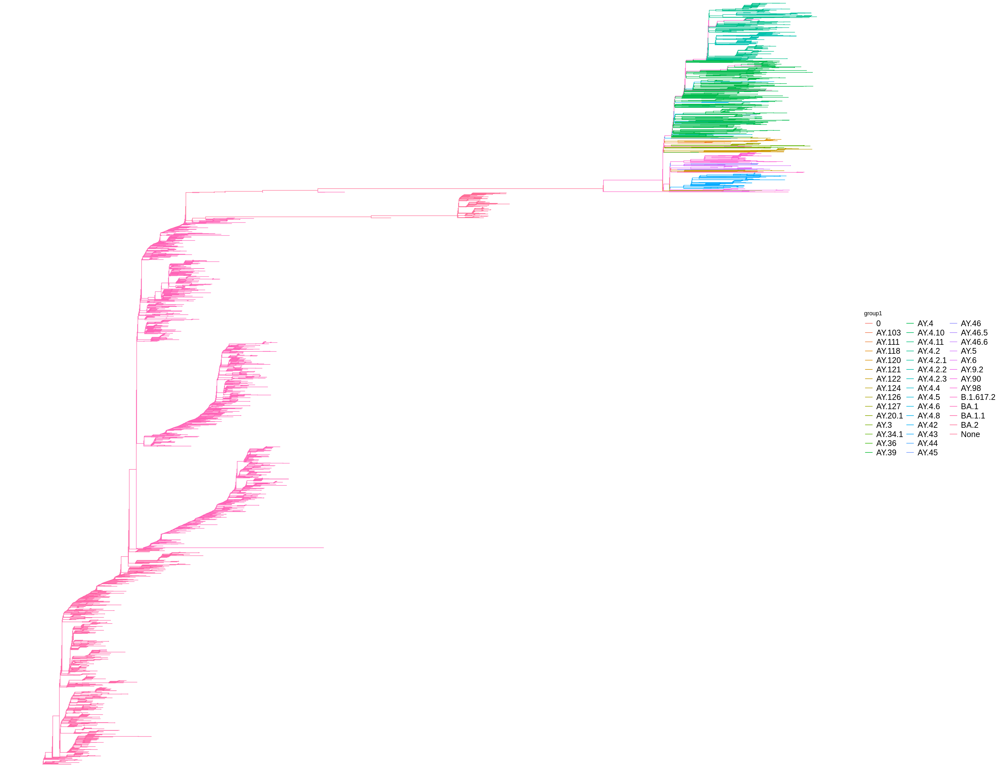

In [8]:
#p <- ggtree (grouptre,  aes(color=group1),size=0.4, layout="rectangular") %<+% traits
#p <- ggtree (grouptre,  aes(color=group1),size=0.4, layout="fan", open.angle=5) # ,  mrsd="2021-07-12", as.Date = T)  ## most recent date
p <- ggtree (grouptre,  aes(color=group1),size=0.4, layout="rectangular") + theme(legend.position="right") + theme(legend.text=element_text(size=15))
p

Specify coloring:

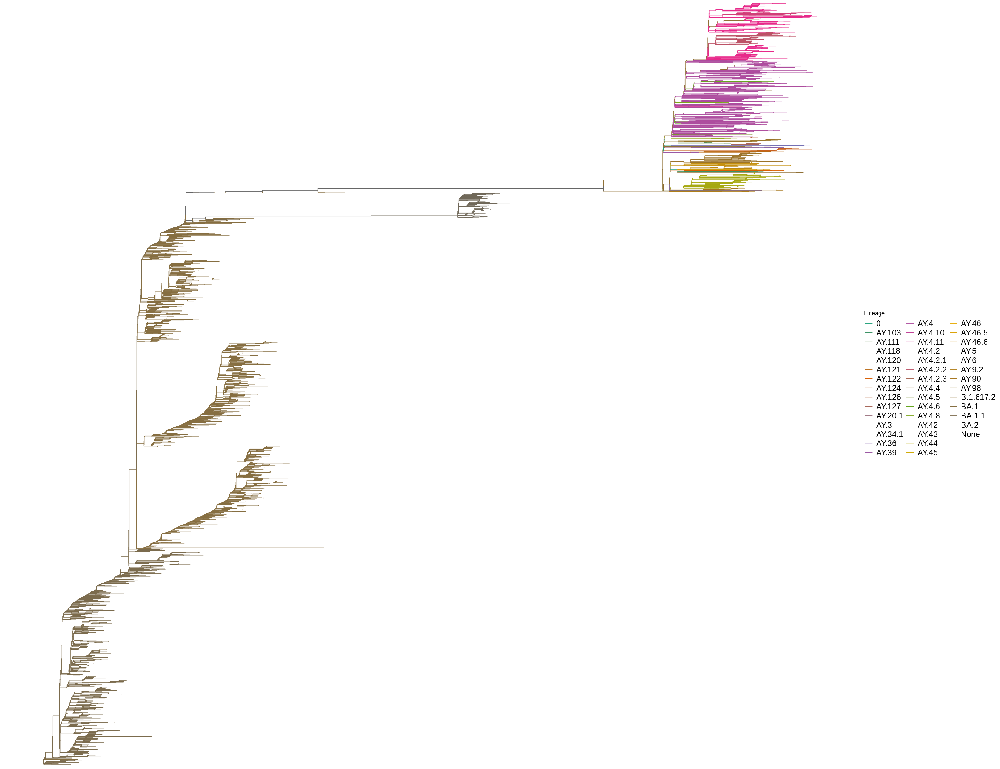

In [9]:
p <- ggtree (grouptre,  aes(color=group1),size=0.4, layout="rectangular") + theme(legend.position="right") + theme(legend.text=element_text(size=15))
p <- p + ggplot2::scale_color_manual(values = getPal_lineage, name="Lineage")
p <- p + new_scale_color()  + new_scale_fill() 
p

# Two-layer ring plot (both colors are of lineages)

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.



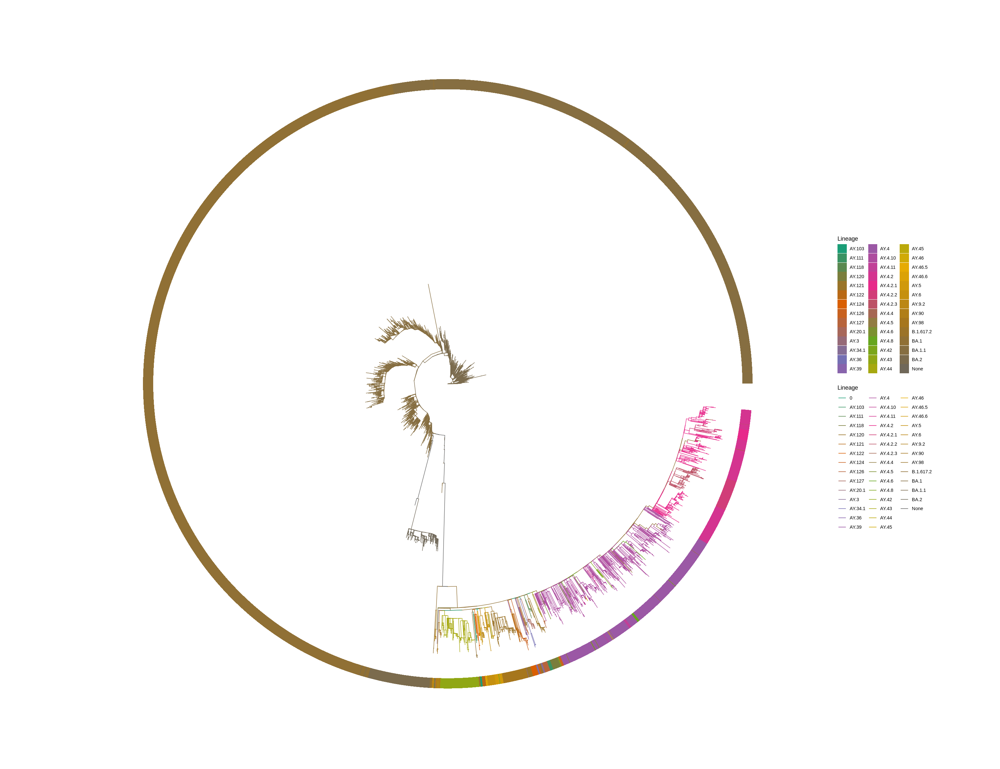

In [10]:
p <- ggtree (grouptre,  aes(color=group1),size=0.4, layout="fan", open.angle=5) # ,  mrsd="2021-07-12", as.Date = T)  ## most recent date
p <- p + ggplot2::scale_color_manual(values = getPal_lineage, name="Lineage")
p <- p %<+% traits

p <- p + geom_fruit(geom=geom_tile, mapping=aes(fill=lineage),color=NA, pwidth = 0.5, offset = 0.07, width=0.00015) +
     ggplot2::scale_fill_manual(values = getPal_lineage, name="Lineage")
p <- p + new_scale_color()  + new_scale_fill() 
p

# Two-layer ring plot colored by 4-letter code

Two-layer ring plot where the outer circle shows four-letter codes:

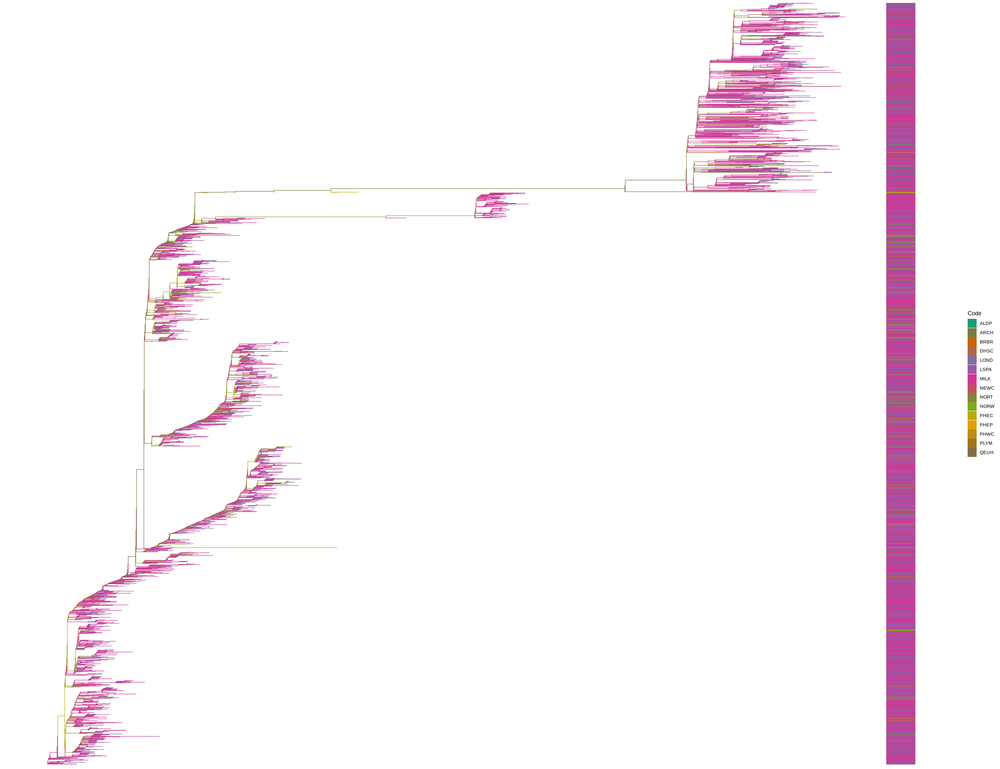

In [77]:
groupInfo2 <- split (tre$tip.label, traits["code"])
grouptre2 <- groupOTU(tre, groupInfo2, group_name="codes")
options(repr.plot.width=26, repr.plot.height=20) ; par(oma=c(0,0,0,0)) 
getPal_code = colorRampPalette( brewer.pal(8,"Dark2"))(length(unique(traits$code))+1)  ## RdYlGn Set2


p <- ggtree (grouptre2,  aes(color=codes),size=0.4, layout="rectangular") # ,  mrsd="2021-07-12", as.Date = T)  ## most recent date
p <- p + ggplot2::scale_color_manual(values = getPal_code, name="Code")
p <- p %<+% traits

p <- p + geom_fruit(geom=geom_tile, mapping=aes(fill=codes),color=NA, pwidth = 0.5, offset = 0.07, width=0.00015) +
     ggplot2::scale_fill_manual(values = getPal_code, name="Code")
p <- p + new_scale_color()  + new_scale_fill() 

p

# Color tips

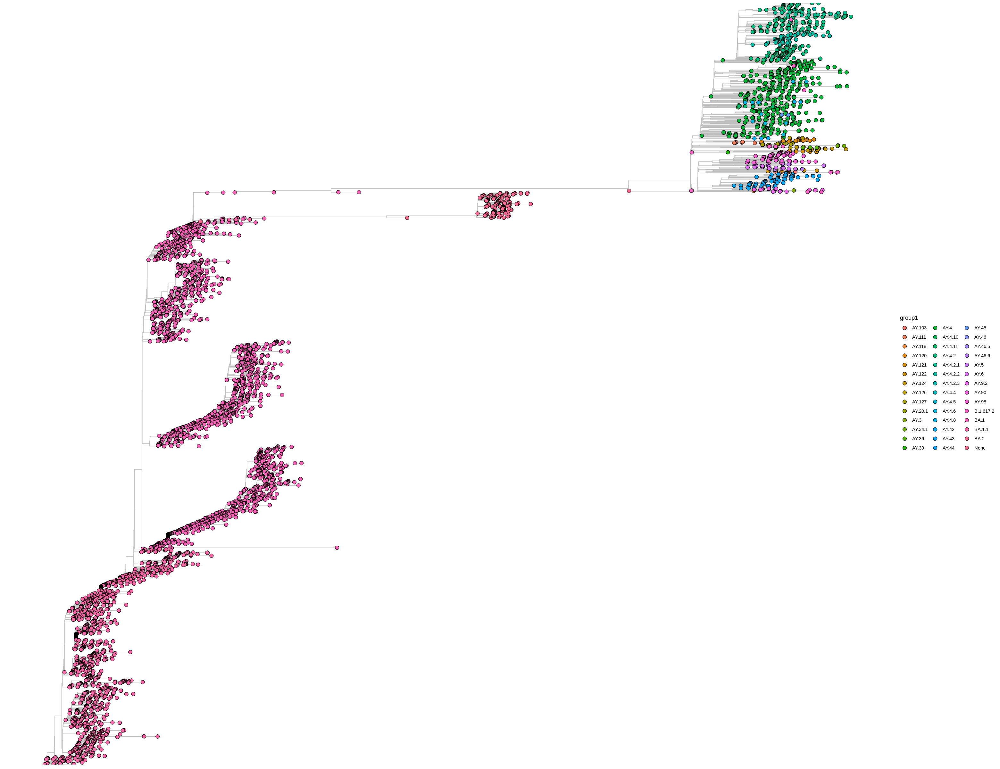

In [52]:
getPal_lineage = colorRampPalette( brewer.pal(8,"Dark2"))(length(unique(traits$lineage))+1)  ## RdYlGn Set2

p <- ggtree (grouptre,  color="gray", size=0.4, layout="rectangular") 
p <- p + geom_tippoint(size=3, mapping=aes(fill=group1), shape=21)
p <- p + scale_color_manual(values = getPal_lineage, name="Lineage")
p

# Zoom in on one clade

First view the tree with all the node labels showing, so you can choose which one to zoom in on:

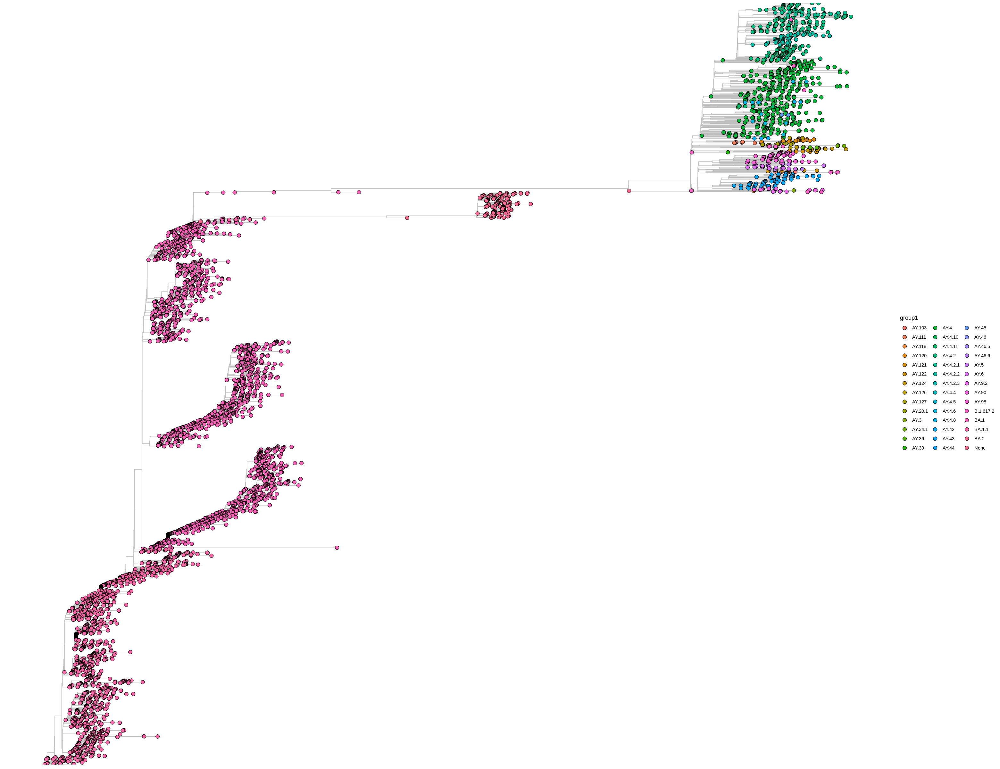

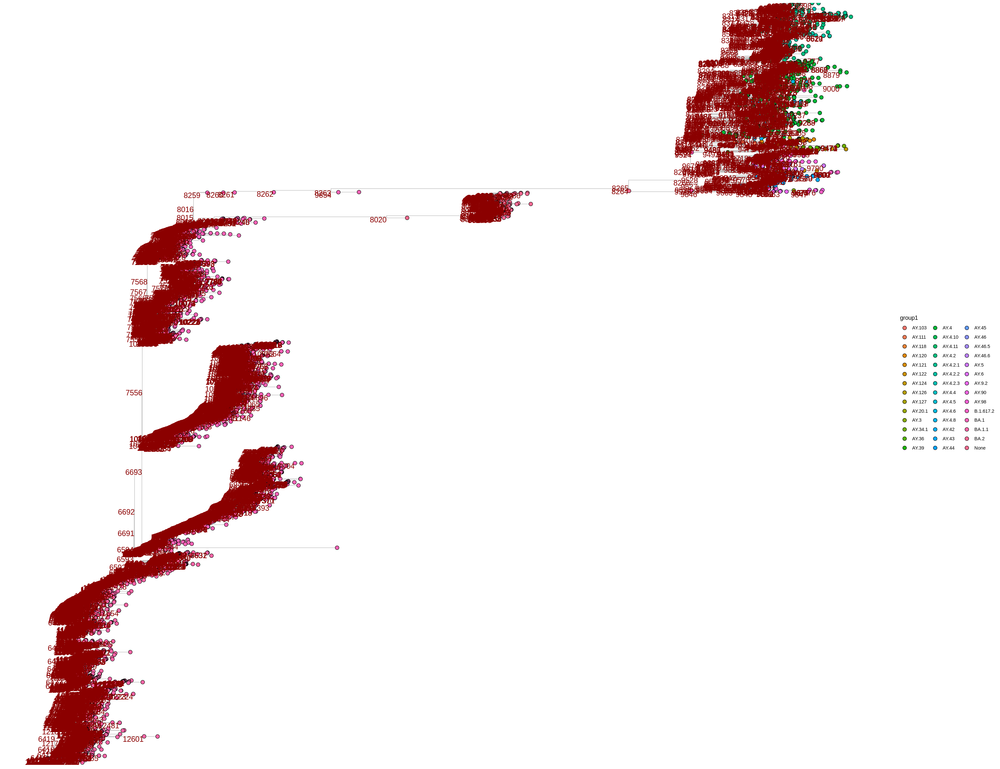

In [62]:
getPal_lineage = colorRampPalette( brewer.pal(8,"Dark2"))(length(unique(traits$lineage))+1)  ## RdYlGn Set2

p <- ggtree (grouptre,  color="gray", size=0.4, layout="rectangular") 
p <- p + geom_tippoint(size=3, mapping=aes(fill=group1), shape=21)
p <- p + scale_color_manual(values = getPal_lineage, name="Lineage")
p

p1 <- p + geom_text2(
    mapping = aes(subset = !isTip, label = node),
    size = 5,
    color = "darkred",
    hjust = 1,
    vjust = 1) 
p1

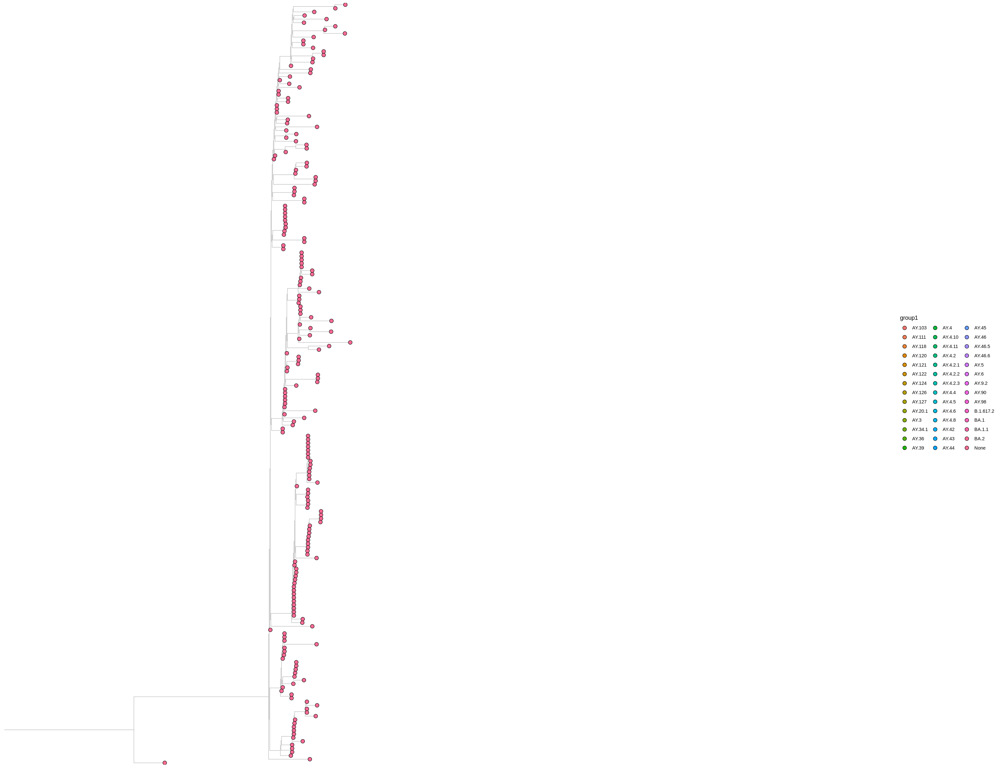

In [64]:
viewClade(p, node = 8020)

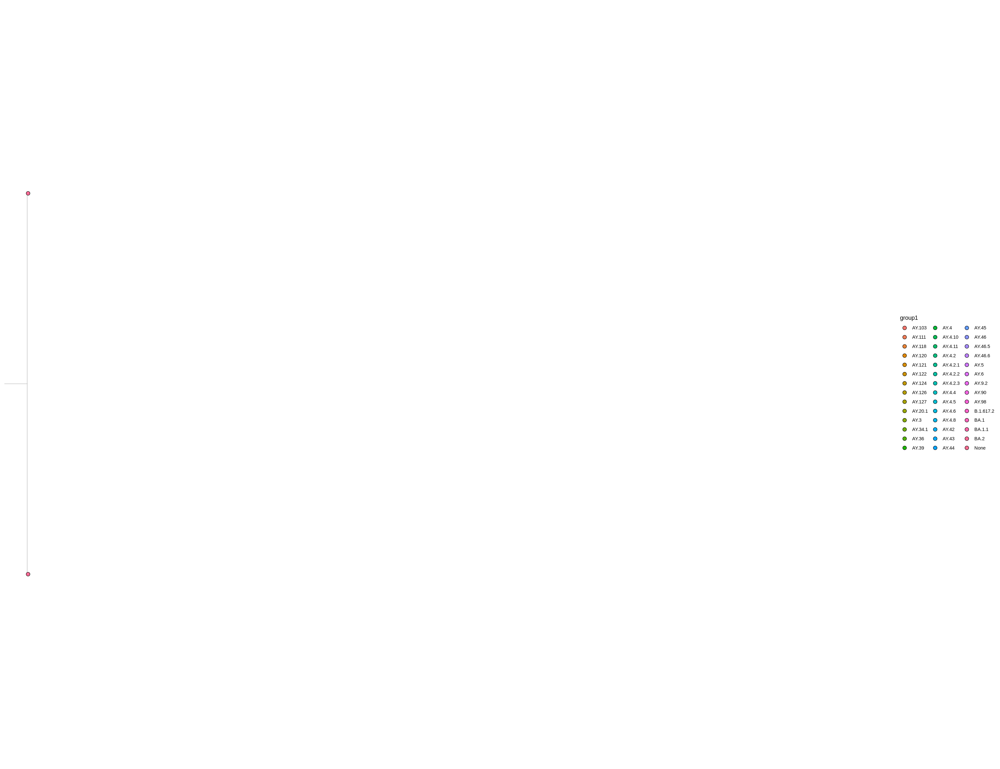

In [65]:
viewClade(p, node = 8126)

You can also highlight nodes:

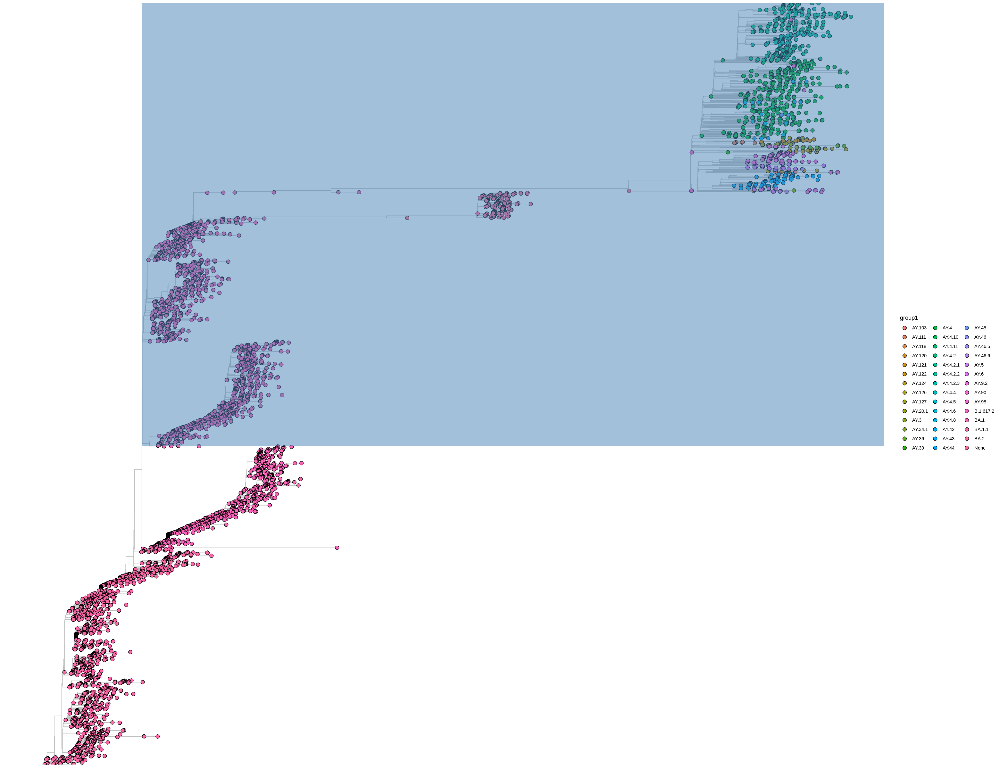

In [67]:
p2 <- p + geom_hilight(  # highlights node 7556 in blue, "extend =" allows us to define the length of the color block
  node = 7556,
  fill = "steelblue",
  extend = 0.00017)
p2

# Align tips

Set ``branch.length = "none"``

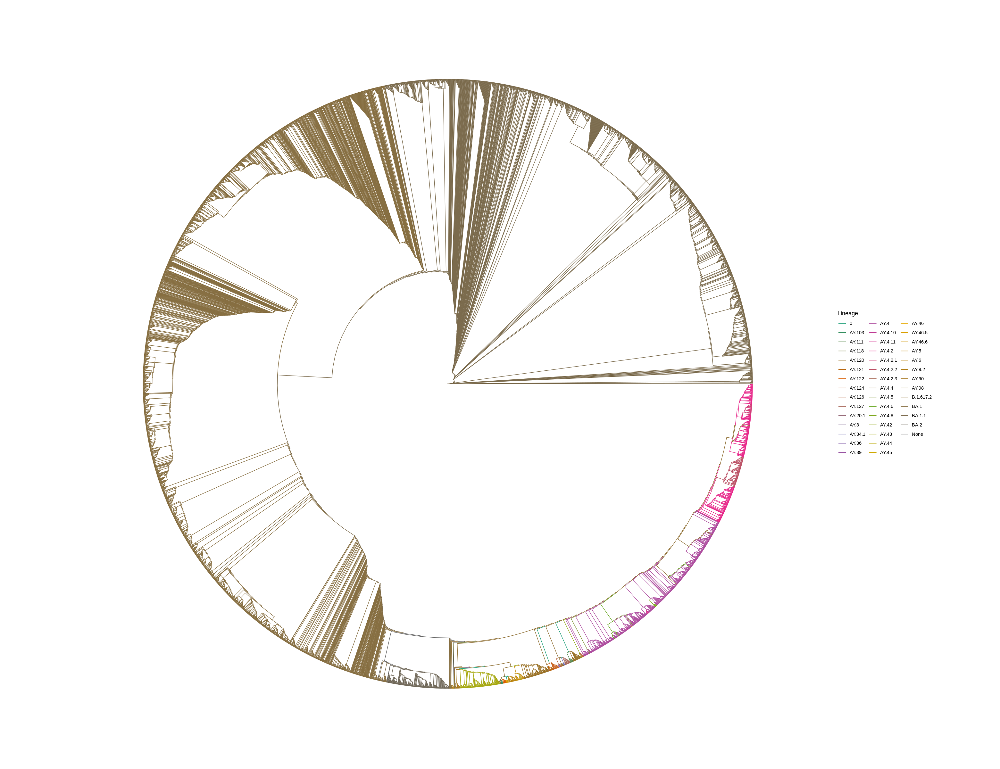

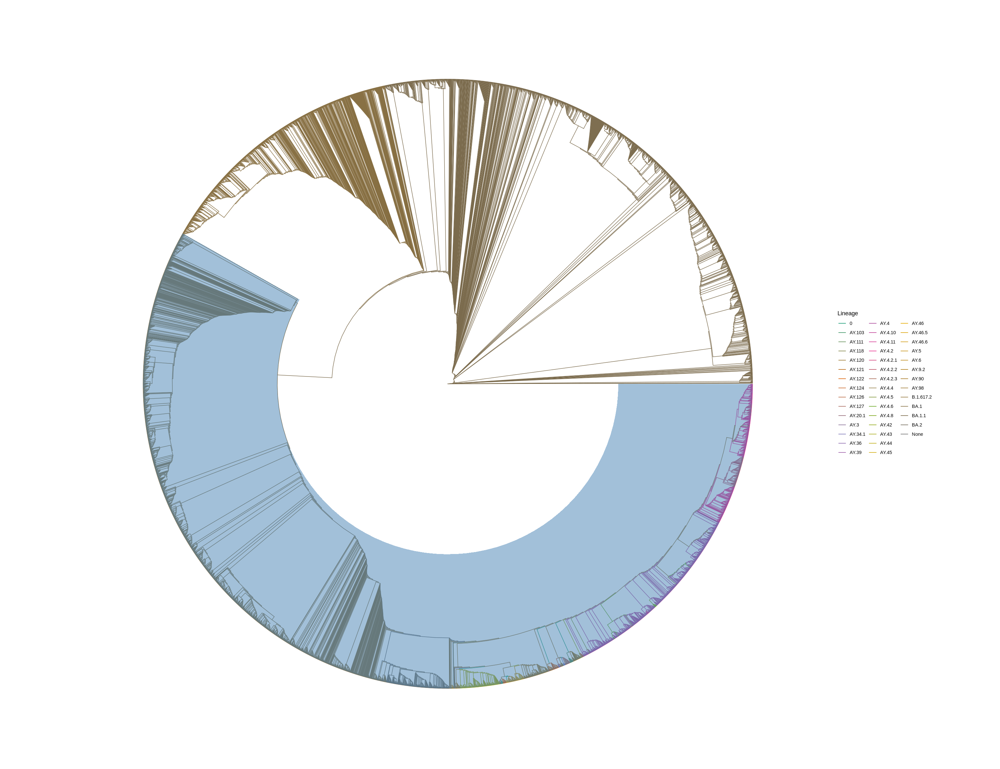

In [71]:
p <- ggtree (grouptre,  aes(color=group1),size=0.4, layout="circular", branch.length = "none") # ,  mrsd="2021-07-12", as.Date = T)  ## most recent date
p <- p + ggplot2::scale_color_manual(values = getPal_lineage, name="Lineage")
p <- p %<+% traits
p

p2 <- p + geom_hilight(  # highlights node 7556 in blue, "extend =" allows us to define the length of the color block
  node = 7556,
  fill = "steelblue",
  extend = 0.00017)
p2

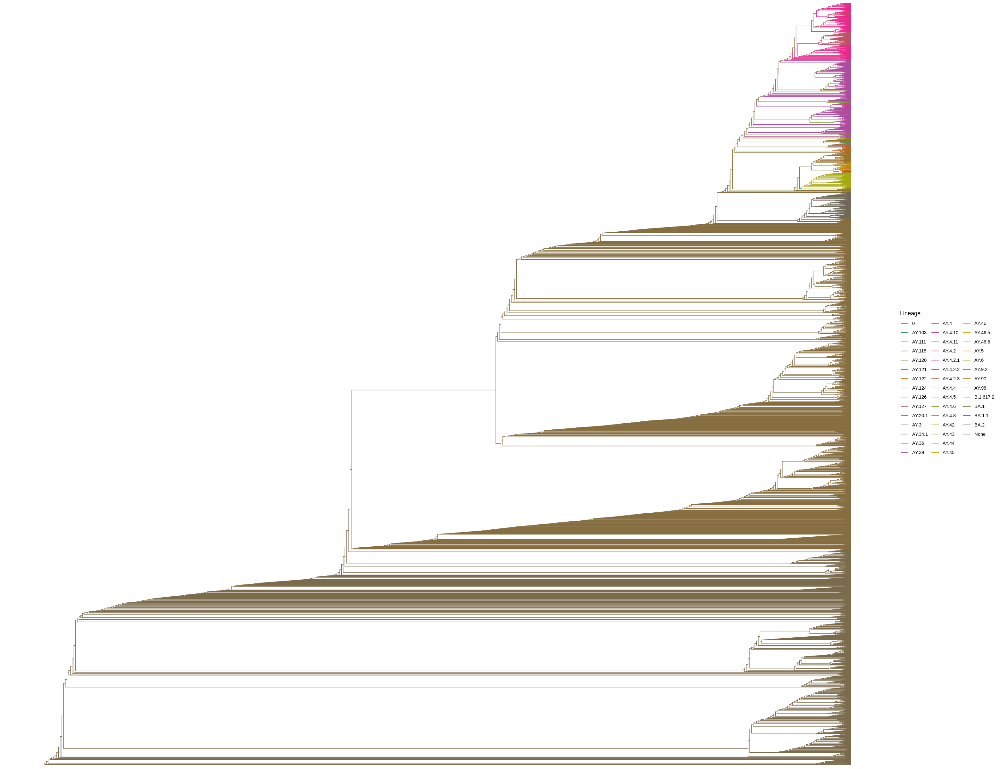

In [28]:
p <- ggtree (grouptre,  aes(color=group1),size=0.4, layout="rectangular", branch.length = "none") # ,  mrsd="2021-07-12", as.Date = T)  ## most recent date
p <- p + ggplot2::scale_color_manual(values = getPal_lineage, name="Lineage")
p <- p %<+% traits
p